## A1

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier

# Function to load the dataset
def load_data(file_path):
    data = pd.read_csv(file_path)
    return data

# Function to preprocess the data
def preprocess_data(data):
    # Assuming first column is the feature and the last column is the target (Final_Marks)
    X = data.iloc[:, 0].values.reshape(-1, 1)  # Reshape X if it's a single column
    y = data.iloc[:, -1]
    return X, y

# Function to split the data into training and test sets
def split_data(X, y, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# Function to train the model
def train_model(X_train, y_train, random_state=42):
    model = RandomForestClassifier(random_state=random_state)
    model.fit(X_train, y_train)
    return model

# Function to evaluate model performance
def evaluate_model(model, X, y):
    y_pred = model.predict(X)
    conf_matrix = confusion_matrix(y, y_pred)
    precision = precision_score(y, y_pred, average='weighted')
    recall = recall_score(y, y_pred, average='weighted')
    f1 = f1_score(y, y_pred, average='weighted')
    return conf_matrix, precision, recall, f1

# Function to display results
def display_results(conf_matrix, precision, recall, f1, dataset_type='Training'):
    print(f"{dataset_type} Data Metrics:")
    print("Confusion Matrix:\n", conf_matrix)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-Score:", f1)
    print()

# Main function to execute the entire workflow
def main(file_path):
    # Step 1: Load data
    data = load_data(file_path)
    
    # Step 2: Preprocess data
    X, y = preprocess_data(data)
    
    # Step 3: Split data into train and test sets
    X_train, X_test, y_train, y_test = split_data(X, y)
    
    # Step 4: Train the model
    model = train_model(X_train, y_train)
    
    # Step 5: Evaluate model performance on training data
    train_conf_matrix, train_precision, train_recall, train_f1 = evaluate_model(model, X_train, y_train)
    display_results(train_conf_matrix, train_precision, train_recall, train_f1, 'Training')
    
    # Step 6: Evaluate model performance on test data
    test_conf_matrix, test_precision, test_recall, test_f1 = evaluate_model(model, X_test, y_test)
    display_results(test_conf_matrix, test_precision, test_recall, test_f1, 'Test')

# Specify the file path and run the main function
if __name__ == "__main__":
    file_path = r"C:\Users\LENOVO T 470S\Downloads\10 - Java_AST.csv"
    main(file_path)


Training Data Metrics:
Confusion Matrix:
 [[  2   2   3   0   0   0   0   0]
 [  1 392  21   1   0   0   0   0]
 [  0  16 274  10   1   0   0   0]
 [  1   4  12 137   3   1   0   0]
 [  0   1   0   7  19   2   0   0]
 [  0   0   0   5   5   8   3   0]
 [  0   0   0   2   2   3  31   0]
 [  0   0   0   0   0   0   0  16]]
Precision: 0.8895189550569907
Recall: 0.8923857868020305
F1-Score: 0.8901493769773877

Test Data Metrics:
Confusion Matrix:
 [[ 0  3  0  0  0  0  0  0]
 [ 0 53 22 18  2  3  1  0]
 [ 1 23 32 13  1  0  2  2]
 [ 0 10 15  4  3  2  0  1]
 [ 0  2  2  3  0  1  1  0]
 [ 0  0  1  3  2  0  0  0]
 [ 0  2  5  2  1  0  3  0]
 [ 0  0  5  0  0  1  0  2]]
Precision: 0.39402690746605035
Recall: 0.3805668016194332
F1-Score: 0.3844797830374754



## A2

In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

# Function to load the dataset
def load_data(file_path):
    data = pd.read_csv(file_path)
    return data

# Function to preprocess the data by defining features and target
def preprocess_data(data, target_column, drop_columns):
    X = data.drop(columns=drop_columns)
    y = data[target_column]
    return X, y

# Function to split the data into training and test sets
def split_data(X, y, test_size=0.2, random_state=42):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    return X_train, X_test, y_train, y_test

# Function to train the Linear Regression model
def train_model(X_train, y_train):
    regressor = LinearRegression()
    regressor.fit(X_train, y_train)
    return regressor

# Function to evaluate the model performance
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return mse, rmse, mape, r2

# Function to display the evaluation metrics
def display_results(mse, rmse, mape, r2):
    print("MSE:", mse)
    print("RMSE:", rmse)
    print("MAPE:", mape)
    print("R2 Score:", r2)

# Main function to run the workflow
def main(file_path, target_column, drop_columns):
    # Step 1: Load data
    data = load_data(file_path)
    
    # Step 2: Preprocess data
    X, y = preprocess_data(data, target_column, drop_columns)
    
    # Step 3: Split data into train and test sets
    X_train, X_test, y_train, y_test = split_data(X, y)
    
    # Step 4: Train the model
    model = train_model(X_train, y_train)
    
    # Step 5: Make predictions
    y_test_pred = model.predict(X_test)
    
    # Step 6: Evaluate the model
    mse, rmse, mape, r2 = evaluate_model(y_test, y_test_pred)
    
    # Step 7: Display the results
    display_results(mse, rmse, mape, r2)

# Specify the file path and relevant columns, then run the main function
if __name__ == "__main__":
    file_path = r"C:\Users\LENOVO T 470S\Downloads\10 - Java_AST.csv"
    target_column = 'Final_Marks'
    drop_columns = ['Final_Marks', 'error_count']  # Columns to drop
    main(file_path, target_column, drop_columns)


MSE: 40.6020847259643
RMSE: 6.371976516432269
MAPE: 1.1669496456625885
R2 Score: -5.7701952734661885


## A3

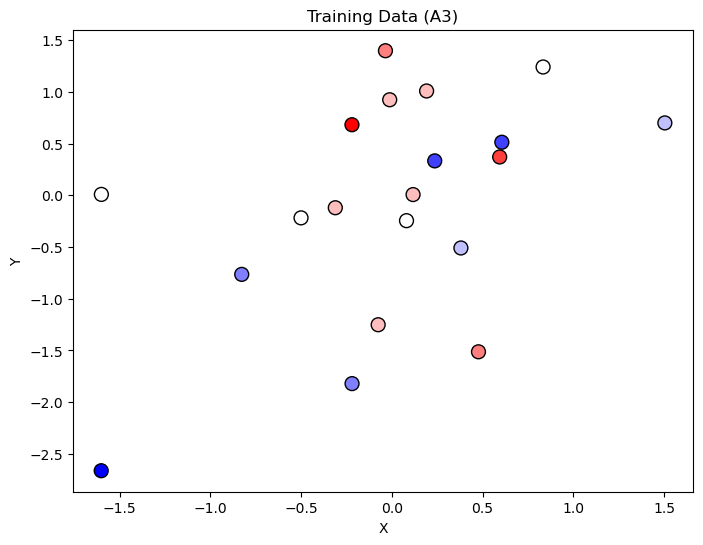

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Function to load the dataset
def load_data(file_path):
    return pd.read_csv(file_path)

# Function to select features and target
def select_features_and_target(data, feature_columns, target_column, max_points=20):
    X = data.iloc[:, feature_columns].values  # Select feature columns
    y = data[target_column].values  # Select target column
    
    # If data exceeds max_points, randomly select max_points
    np.random.seed(42)
    if len(X) > max_points:
        indices = np.random.choice(len(X), max_points, replace=False)
        X = X[indices]
        y = y[indices]
    
    return X, y

# Function to plot the training data
def plot_training_data(X, y, title='Training Data', xlabel='X', ylabel='Y'):
    plt.figure(figsize=(8, 6))
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap='bwr', edgecolor='k', s=100)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Function to train kNN model
def train_knn(X_train, y_train, n_neighbors=3):
    knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    knn.fit(X_train, y_train)
    return knn

# Main function to execute the workflow
def main(file_path):
    # Step 1: Load data
    data = load_data(file_path)
    
    # Step 2: Select features and target
    X_train, y_train = select_features_and_target(data, feature_columns=[0, 1], target_column='Final_Marks')

    # Step 3: Plot the training data
    plot_training_data(X_train, y_train, title='Training Data (A3)', xlabel='X', ylabel='Y')

    # Step 4: Train kNN classifier (k=3)
    knn_model = train_knn(X_train, y_train)

    # Return trained model if needed for further use
    return knn_model

# Example usage with data
if __name__ == "__main__":
    file_path = r"C:\Users\LENOVO T 470S\Downloads\10 - Java_AST.csv"  # Update with your dataset path
    knn_model = main(file_path)


## A4

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Function to extract features and target
def extract_features_and_target(data, feature_columns, target_column):
    X = data[feature_columns].values
    y = data[target_column].values
    return X, y

# Function to generate mesh grid for test data
def generate_test_grid(x_min=0, x_max=10, y_min=0, y_max=10, step_size=0.1):
    xx, yy = np.meshgrid(np.arange(x_min, x_max, step_size), np.arange(y_min, y_max, step_size))
    X_test = np.c_[xx.ravel(), yy.ravel()]
    return xx, yy, X_test

# Function to train and predict with kNN
def train_knn(X_train, y_train, X_test, k=3):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_test_pred = knn.predict(X_test)
    return y_test_pred

# Function to plot decision boundary
def plot_decision_boundary(xx, yy, y_test_pred, X_train, y_train, k):
    Z = y_test_pred.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.3, cmap='bwr')
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='bwr', edgecolor='k')
    plt.title(f'Decision Boundary (k = {k})')
    plt.show()

# Function to observe changes in decision boundaries with varying k
def observe_boundary_changes(X_train, y_train, X_test, xx, yy, k_values):
    for k in k_values:
        # Train kNN and predict
        y_test_pred = train_knn(X_train, y_train, X_test, k)
        
        # Plot decision boundary
        plot_decision_boundary(xx, yy, y_test_pred, X_train, y_train, k)

# Main function to run the workflow
def main(data):
    # Step 1: Extract features and target
    X_train, y_train = extract_features_and_target(data, ['ast_27', 'ast_130'], 'Final_Marks')
    
    # Step 2: Generate test data grid
    xx, yy, X_test = generate_test_grid()
    
    # Step 3: Train and plot decision boundary for k=3
    y_test_pred = train_knn(X_train, y_train, X_test, k=3)
    plot_decision_boundary(xx, yy, y_test_pred, X_train, y_train, k=3)
    
    # Step 4: Vary k and observe changes in class boundary
    k_values = [1, 3, 5, 7, 9]
    observe_boundary_changes(X_train, y_train, X_test, xx, yy, k_values)

# Example usage with data
if __name__ == "__main__":
    # Assuming 'data' is already loaded in your environment
    main(data)


NameError: name 'data' is not defined

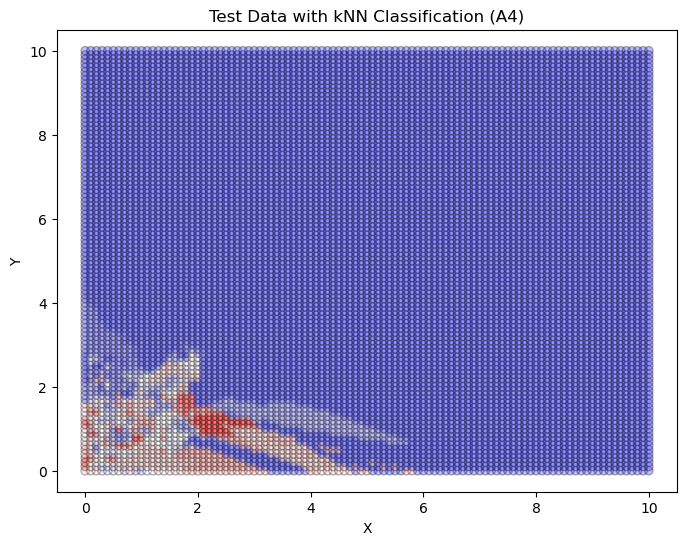

In [5]:
# Generate test data grid points between 0 and 10 with increments of 0.1
x_values = np.arange(0, 10.1, 0.1)
y_values = np.arange(0, 10.1, 0.1)
X_test = np.array([[x, y] for x in x_values for y in y_values])

# Classify the test points using the kNN model trained in A3
y_test_pred = knn.predict(X_test)

# Plot the test data with predicted class colors
plt.figure(figsize=(8, 6))
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test_pred, cmap='bwr', alpha=0.3, edgecolor='k')
plt.title('Test Data with kNN Classification (A4)')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()


## A5

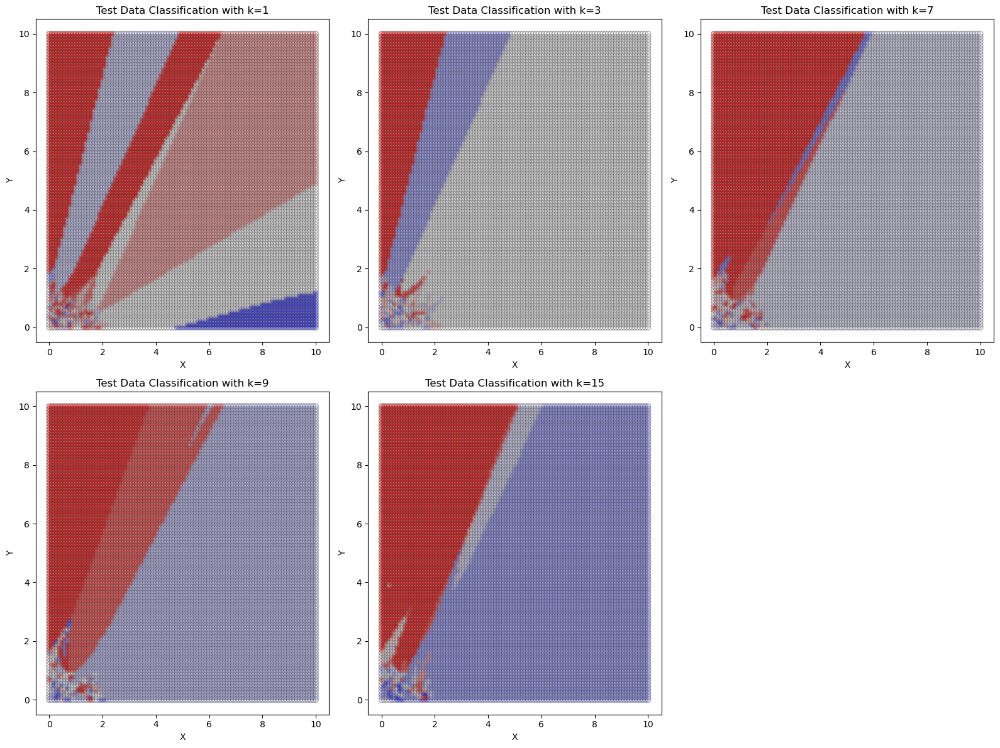

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Function to load the dataset
def load_data(file_path):
    return pd.read_csv(file_path)

# Function to extract features and target from the dataset
def extract_features_and_target(data, feature_columns, target_column):
    X = data.iloc[:, feature_columns].values  # Select the first two columns as features
    y = data[target_column].values  # Select 'Final_Marks' as the target
    return X, y

# Function to generate test grid points
def generate_test_grid(x_min=0, x_max=10, y_min=0, y_max=10, step=0.1):
    x_values = np.arange(x_min, x_max + step, step)
    y_values = np.arange(y_min, y_max + step, step)
    X_test = np.array([[x, y] for x in x_values for y in y_values])
    return X_test

# Function to train kNN and predict on the test data
def classify_test_data(X_train, y_train, X_test, k):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_test_pred = knn.predict(X_test)
    return y_test_pred

# Function to plot classification results for different values of k
def plot_classification_results(X_test, y_test_pred, k, subplot_position):
    plt.subplot(2, 3, subplot_position)
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test_pred, cmap='bwr', alpha=0.3, edgecolor='k')
    plt.title(f'Test Data Classification with k={k}')
    plt.xlabel('X')
    plt.ylabel('Y')

# Function to visualize classification with varying k values
def visualize_knn_classification(data, feature_columns, target_column, k_values):
    # Extract features and target
    X_train, y_train = extract_features_and_target(data, feature_columns, target_column)
    
    # Generate test grid data
    X_test = generate_test_grid()

    # Create the plot figure
    plt.figure(figsize=(16, 12))
    
    # Loop through different values of k and plot the results
    for i, k in enumerate(k_values, 1):
        y_test_pred = classify_test_data(X_train, y_train, X_test, k)
        plot_classification_results(X_test, y_test_pred, k, i)

    plt.tight_layout()
    plt.show()

# Main function to run the workflow
def main(file_path):
    # Load the dataset
    data = load_data(file_path)

    # Define the values of k to visualize
    k_values = [1, 3, 7, 9, 15]  
    
    # Visualize kNN classification for different k values
    visualize_knn_classification(data, feature_columns=[0, 1], target_column='Final_Marks', k_values=k_values)

# Example usage with data loading
if __name__ == "__main__":
    # Provide the file path to your dataset
    file_path = r"C:\Users\LENOVO T 470S\Downloads\10 - Java_AST.csv"  # Update with the correct file path
    main(file_path)


## A6


Working on Feature Pair 1: Columns 0 and 1


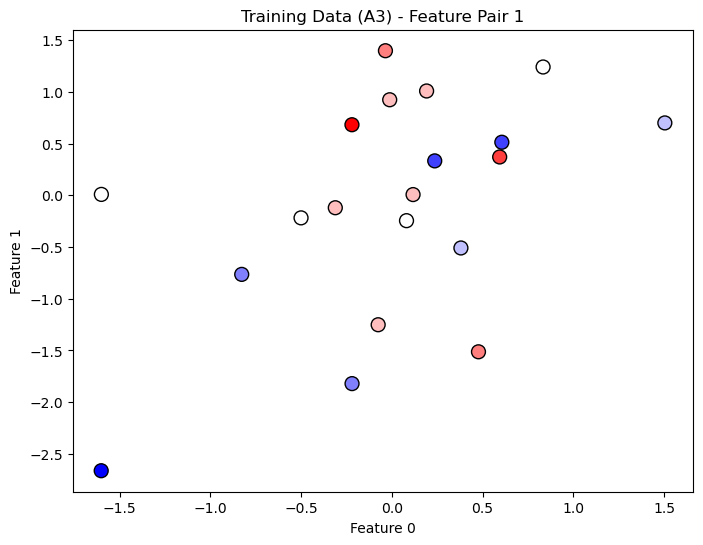

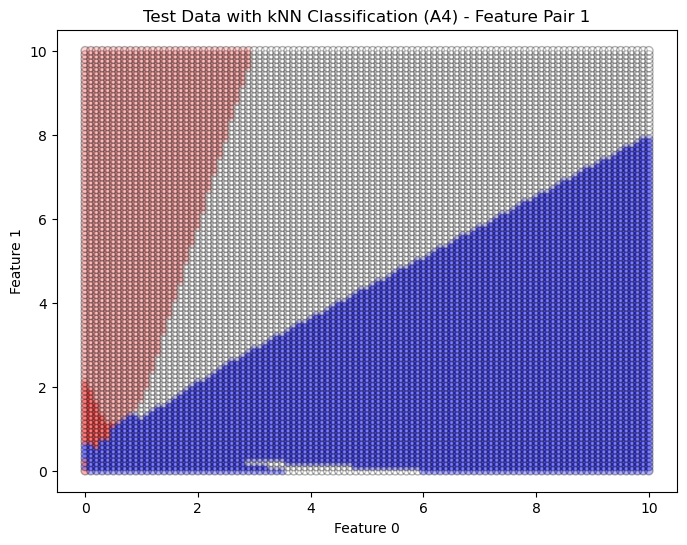

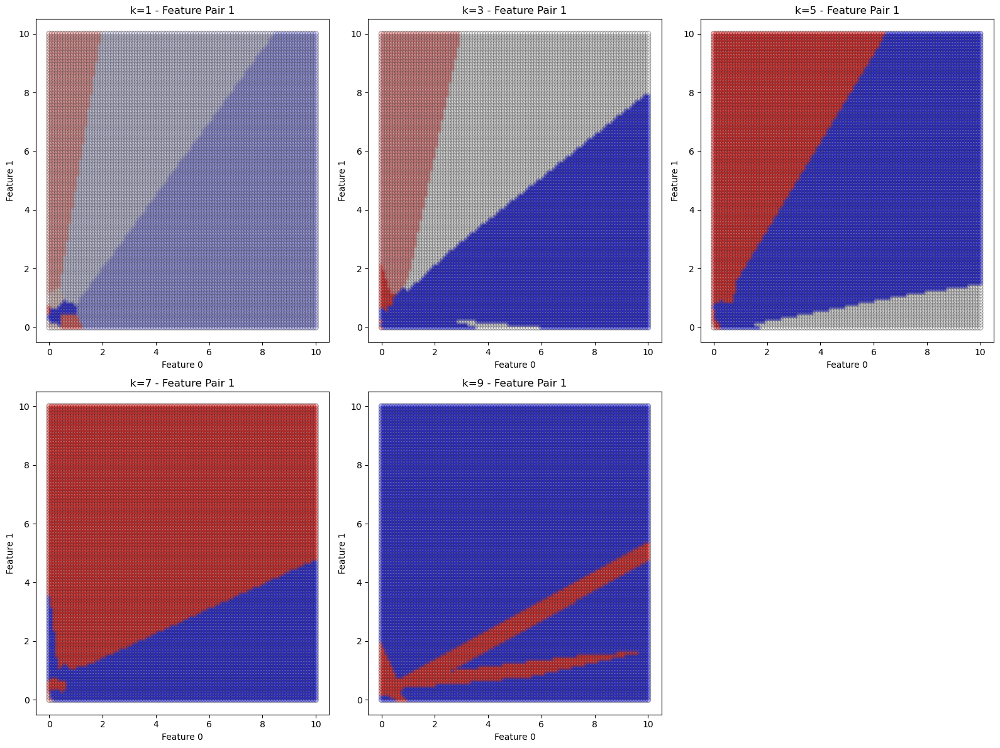


Working on Feature Pair 2: Columns 2 and 3


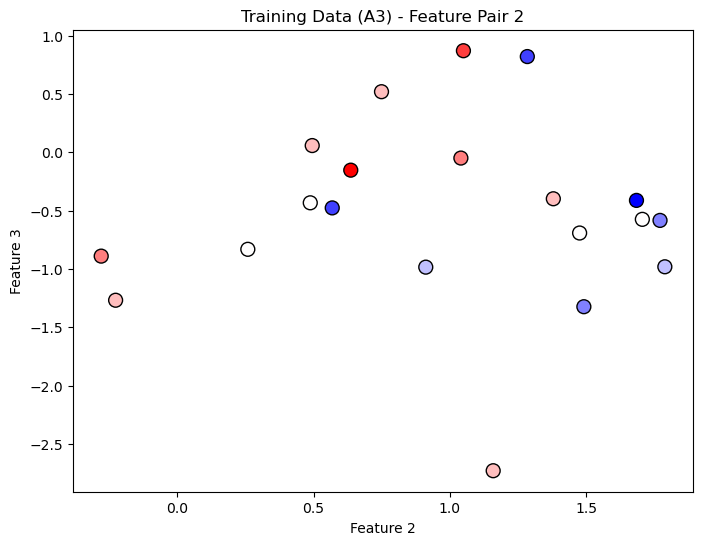

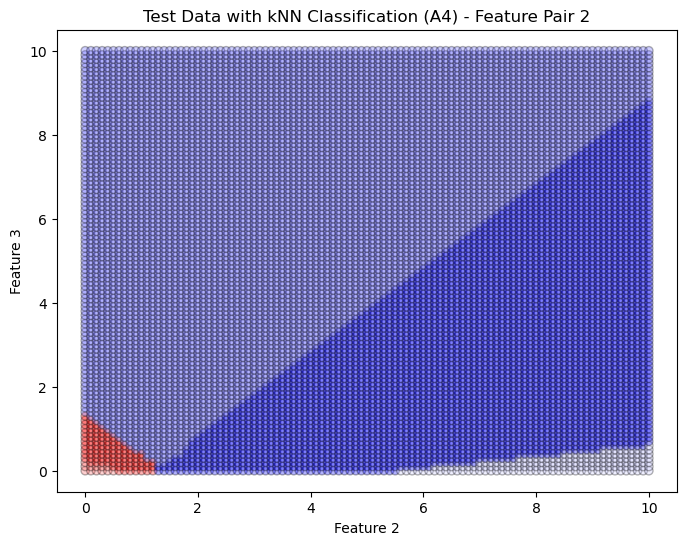

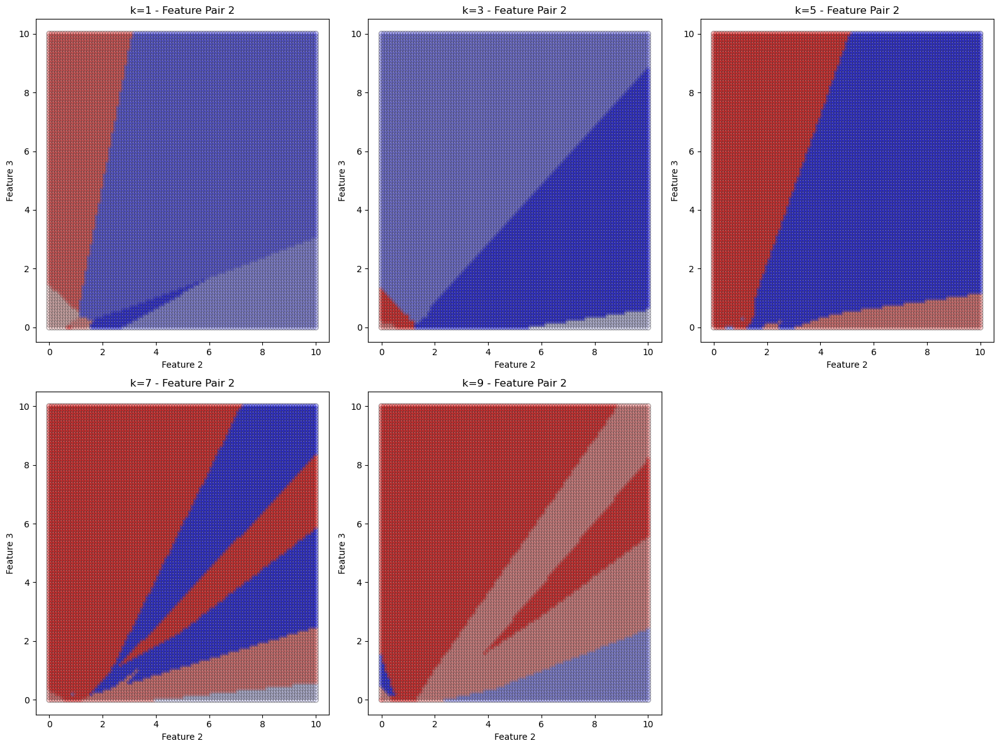


Working on Feature Pair 3: Columns 4 and 5


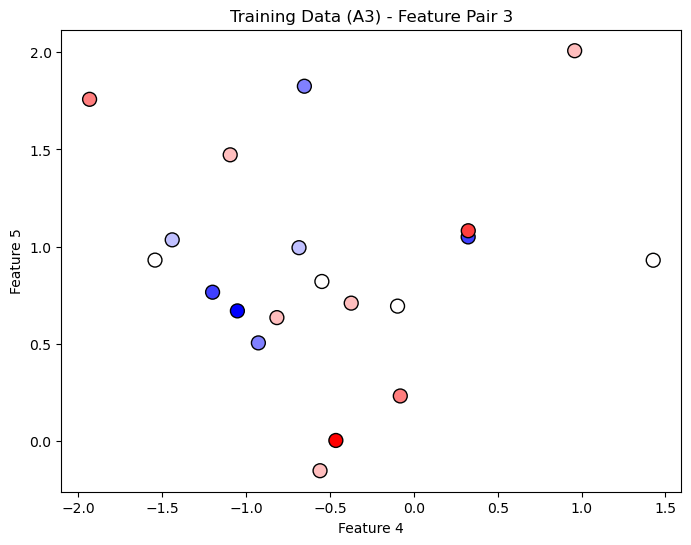

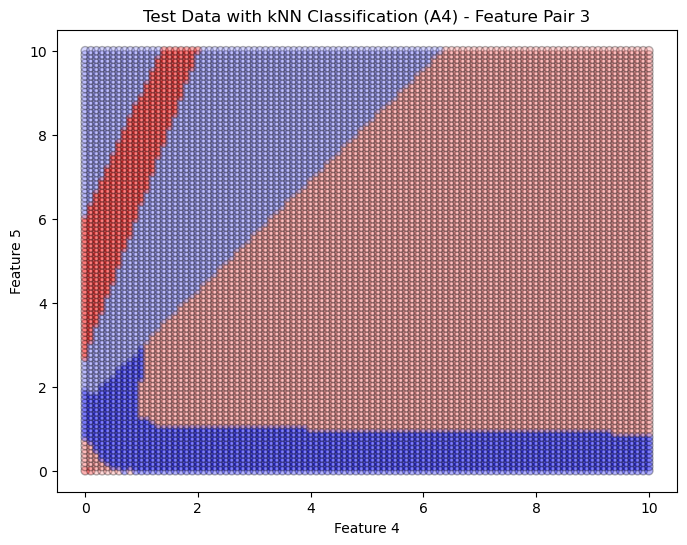

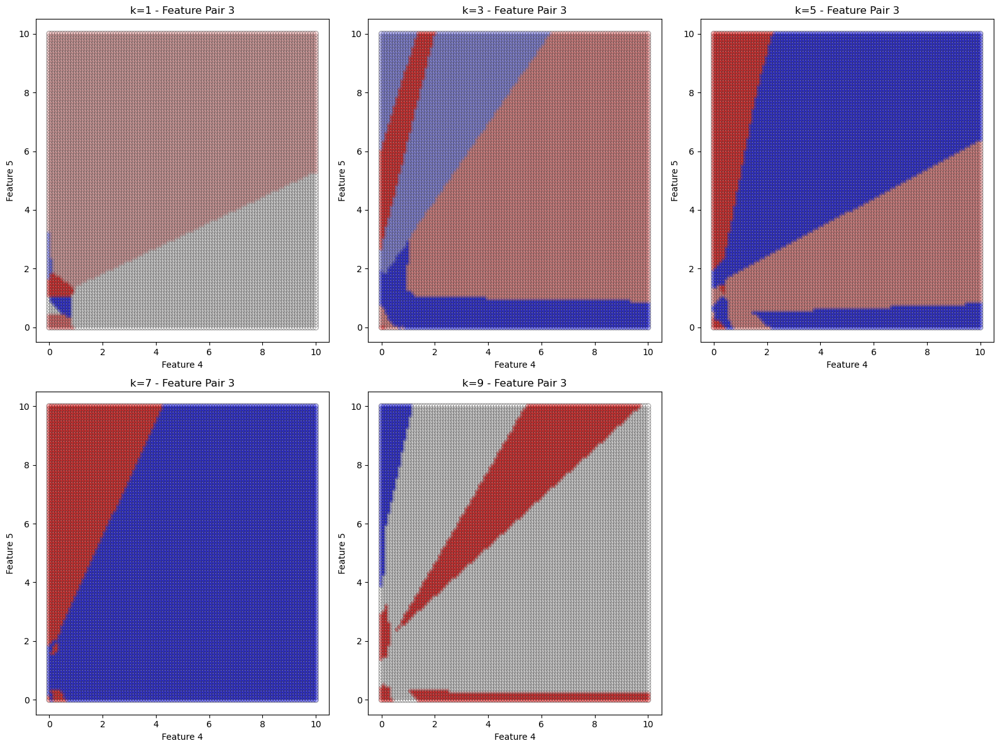

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier

# Function to load the dataset
def load_data(file_path):
    return pd.read_csv(file_path)

# Function to select a pair of features and target
def select_features_and_target(data, f1, f2, target_column, max_samples=20):
    X_train = data.iloc[:, [f1, f2]].values  # Select two features
    y_train = data[target_column].values  # Select the target column

    # If there are more than max_samples, randomly select max_samples
    np.random.seed(42)
    if len(X_train) > max_samples:
        indices = np.random.choice(len(X_train), max_samples, replace=False)
        X_train = X_train[indices]
        y_train = y_train[indices]
    
    return X_train, y_train

# Function to plot the training data
def plot_training_data(X_train, y_train, f1, f2, idx):
    plt.figure(figsize=(8, 6))
    plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap='bwr', edgecolor='k', s=100)
    plt.title(f'Training Data (A3) - Feature Pair {idx + 1}')
    plt.xlabel(f'Feature {f1}')
    plt.ylabel(f'Feature {f2}')
    plt.show()

# Function to generate test data grid
def generate_test_grid(x_min=0, x_max=10, step=0.1):
    x_values = np.arange(x_min, x_max + step, step)
    y_values = np.arange(x_min, x_max + step, step)
    X_test = np.array([[x, y] for x in x_values for y in y_values])
    return X_test

# Function to classify test data using kNN and plot the results
def classify_and_plot(X_train, y_train, X_test, f1, f2, idx, k=3):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_test_pred = knn.predict(X_test)
    
    plt.figure(figsize=(8, 6))
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test_pred, cmap='bwr', alpha=0.3, edgecolor='k')
    plt.title(f'Test Data with kNN Classification (A4) - Feature Pair {idx + 1}')
    plt.xlabel(f'Feature {f1}')
    plt.ylabel(f'Feature {f2}')
    plt.show()

# Function to experiment with different k values and plot results
def experiment_with_k(X_train, y_train, X_test, f1, f2, idx, k_values=[1, 3, 5, 7, 9]):
    plt.figure(figsize=(16, 12))
    for i, k in enumerate(k_values, 1):
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)
        y_test_pred = knn.predict(X_test)
        
        plt.subplot(2, 3, i)
        plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test_pred, cmap='bwr', alpha=0.3, edgecolor='k')
        plt.title(f'k={k} - Feature Pair {idx + 1}')
        plt.xlabel(f'Feature {f1}')
        plt.ylabel(f'Feature {f2}')
    plt.tight_layout()
    plt.show()

# Main function to run the workflow
def main(file_path):
    # Load data
    data = load_data(file_path)

    feature_pairs = [(0, 1), (2, 3), (4, 5)]  # Example pairs of features from the dataset
    for idx, (f1, f2) in enumerate(feature_pairs):
        print(f"\nWorking on Feature Pair {idx + 1}: Columns {f1} and {f2}")

        # Step 1: Select features and target
        X_train, y_train = select_features_and_target(data, f1, f2, target_column='Final_Marks')

        # Step 2: Plot training data
        plot_training_data(X_train, y_train, f1, f2, idx)

        # Step 3: Generate test data
        X_test = generate_test_grid()

        # Step 4: Classify and plot with kNN (k=3)
        classify_and_plot(X_train, y_train, X_test, f1, f2, idx, k=3)

        # Step 5: Experiment with different k values
        experiment_with_k(X_train, y_train, X_test, f1, f2, idx)

# Example usage
if __name__ == "__main__":
    file_path = r"C:\Users\LENOVO T 470S\Downloads\10 - Java_AST.csv"  # Provide your correct file path
    main(file_path)


## A7

In [13]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

# Function to load the dataset
def load_data(file_path):
    return pd.read_csv(file_path)

# Function to select features and target
def select_features_and_target(data, feature_columns, target_column):
    X = data.iloc[:, feature_columns].values  # Select feature columns
    y = data[target_column].values  # Select target column
    return X, y

# Function to define the kNN model
def define_knn_model():
    return KNeighborsClassifier()

# Function to define the parameter grid
def define_param_grid(start=1, stop=20):
    return {'n_neighbors': np.arange(start, stop)}

# Function to perform grid search to find the best hyperparameters
def perform_grid_search(knn_model, param_grid, X, y, cv=5, scoring='accuracy'):
    grid_search = GridSearchCV(knn_model, param_grid, cv=cv, scoring=scoring)
    grid_search.fit(X, y)
    return grid_search.best_params_, grid_search.best_score_

# Function to display the best parameters and corresponding score
def display_best_params(best_params, best_score):
    best_k = best_params['n_neighbors']
    print(f"Best 'k' value: {best_k}")
    print(f"Best Cross-Validation Accuracy: {best_score:.4f}")

# Main function to execute the workflow
def main(file_path):
    # Step 1: Load the dataset
    data = load_data(file_path)

    # Step 2: Select features and target
    X, y = select_features_and_target(data, feature_columns=[0, 1], target_column='Final_Marks')

    # Step 3: Define kNN model
    knn_model = define_knn_model()

    # Step 4: Define parameter grid
    param_grid = define_param_grid()

    # Step 5: Perform grid search
    best_params, best_score = perform_grid_search(knn_model, param_grid, X, y)

    # Step 6: Display best parameters and score
    display_best_params(best_params, best_score)

# Example usage
if __name__ == "__main__":
    file_path = r"C:\Users\LENOVO T 470S\Downloads\10 - Java_AST.csv"  # Update this path as needed
    main(file_path)


D:\Anaconda\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


Best 'k' value: 17
Best Cross-Validation Accuracy: 0.1460
